# Pipeline de Dataset: Descarga y Preparación

**Universidad Cooperativa de Colombia - Semillero DataTech**

Este notebook permite:
1. **Descargar imágenes** de plagas agrícolas desde iNaturalist API
2. **Preparar el dataset** dividiendo en train/validation/test
3. **Visualizar** la distribución y ejemplos del dataset

---

## 1. Configuración Inicial

In [2]:
# Importaciones necesarias
import os
import sys
import time
import shutil
import random
import hashlib
import requests
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from collections import defaultdict
from IPython.display import display, HTML, clear_output
from PIL import Image

# Configurar el path del proyecto
PROJECT_DIR = Path.cwd()
sys.path.insert(0, str(PROJECT_DIR))

print(f"Directorio del proyecto: {PROJECT_DIR}")

Directorio del proyecto: c:\Users\santi\OneDrive\Desktop\UNIVERSIDAD\Semillero\Proyecto


In [3]:
# Importar configuración del proyecto
from config import (
    DATA_DIR, DATASET_DIR, TRAIN_DIR, VALIDATION_DIR, TEST_DIR,
    PEST_CLASSES, ALL_CLASSES,
    INATURALIST_CONFIG, SPLIT_CONFIG,
    create_directories, print_config
)

# Mostrar configuración actual
print_config()

CONFIGURACION DEL PROYECTO

Directorio base: C:\Users\santi\OneDrive\Desktop\UNIVERSIDAD\Semillero\Proyecto
Total clases: 20

Clases configuradas:
  - ceratitis_capitata: Mosca del Mediterráneo
  - heilipus_lauri: Barrenador del hueso del aguacate
  - rhynchophorus_palmarum: Picudo negro de la palma
  - strategus_aloeus: Escarabajo torito
  - dalbulus_maidis: Chicharrita del maíz
  - oebalus_insularis: Chinche de la espiga
  - tagosodes_orizicolus: Sogata
  - diaphorina_citri: Psílido asiático de los cítricos
  - trichoplusia_ni: Falso medidor
  - piezodorus_guildinii: Chinche de la alfalfa
  - atta_cephalotes: Hormiga arriera
  - blissus_leucopterus: Chinche de los pastos
  - spodoptera_frugiperda: Gusano cogollero
  - anastrepha_curvicauda: Mosca de la fruta
  - diatraea_lisetta: Barrenador de cana
  - compsus_viridivittatus: Escarabajo rayado
  - dysdercus_concinnus: Chinche hilvanero
  - leptinotarsa_decemlineata: Escarabajo de Colorado
  - cyclocephala_lunulata: Escarabajo rinocer

In [4]:
# Crear directorios necesarios
create_directories()
print("\nDirectorios creados/verificados correctamente.")

Directorios creados en: C:\Users\santi\OneDrive\Desktop\UNIVERSIDAD\Semillero\Proyecto

Directorios creados/verificados correctamente.


---
## 2. Descarga de Imágenes desde iNaturalist

### 2.1 Ver clases disponibles para descargar

In [5]:
# Mostrar información de las nuevas clases disponibles
print("=" * 70)
print("CLASES DISPONIBLES PARA DESCARGAR")
print("=" * 70)

for i, (class_name, info) in enumerate(PEST_CLASSES.items(), 1):
    print(f"\n{i}. {class_name}")
    print(f"   Nombre común: {info['nombre_comun']}")
    print(f"   Cultivos afectados: {', '.join(info['cultivos'])}")
    print(f"   Taxon ID (iNaturalist): {info.get('taxon_id', 'Auto-detectar')}")

print("\n" + "=" * 70)

CLASES DISPONIBLES PARA DESCARGAR

1. ceratitis_capitata
   Nombre común: Mosca del Mediterráneo
   Cultivos afectados: citricos, cafe, mango, frutas
   Taxon ID (iNaturalist): 199404

2. heilipus_lauri
   Nombre común: Barrenador del hueso del aguacate
   Cultivos afectados: aguacate
   Taxon ID (iNaturalist): 268874

3. rhynchophorus_palmarum
   Nombre común: Picudo negro de la palma
   Cultivos afectados: palma de aceite, coco
   Taxon ID (iNaturalist): 304994

4. strategus_aloeus
   Nombre común: Escarabajo torito
   Cultivos afectados: palma de aceite, coco
   Taxon ID (iNaturalist): 199942

5. dalbulus_maidis
   Nombre común: Chicharrita del maíz
   Cultivos afectados: maiz
   Taxon ID (iNaturalist): 738011

6. oebalus_insularis
   Nombre común: Chinche de la espiga
   Cultivos afectados: arroz
   Taxon ID (iNaturalist): 296297

7. tagosodes_orizicolus
   Nombre común: Sogata
   Cultivos afectados: arroz
   Taxon ID (iNaturalist): 974945

8. diaphorina_citri
   Nombre común: Psíl

### 2.2 Clase del iNaturalistDownloader

In [6]:
class INaturalistDownloader:
    """Clase para descargar imágenes desde iNaturalist API."""
    
    def __init__(self, delay: float = 1.0):
        """
        Inicializa el descargador.
        
        Args:
            delay: Segundos de espera entre peticiones a la API.
        """
        self.base_url = INATURALIST_CONFIG["base_url"]
        self.delay = delay
        self.session = requests.Session()
        self.session.headers.update({
            "User-Agent": "PlagasAgricolasProject/1.0 (Universidad Cooperativa de Colombia)"
        })
        
    def search_observations(self, taxon_id: int, per_page: int = 200, page: int = 1, quality_grade: str = "research") -> dict:
        """Busca observaciones en iNaturalist por taxon_id."""
        url = f"{self.base_url}/observations"
        params = {
            "taxon_id": taxon_id,
            "per_page": per_page,
            "page": page,
            "quality_grade": quality_grade,
            "photos": "true",
            "order": "desc",
            "order_by": "votes",
        }
        
        try:
            response = self.session.get(url, params=params, timeout=30)
            response.raise_for_status()
            time.sleep(self.delay)
            return response.json()
        except requests.exceptions.RequestException as e:
            print(f"Error en la petición: {e}")
            return {"results": [], "total_results": 0}
    
    def get_taxon_id(self, species_name: str):
        """Obtiene el taxon_id a partir del nombre científico."""
        search_name = species_name.replace("_", " ")
        url = f"{self.base_url}/taxa"
        params = {"q": search_name, "per_page": 1}
        
        try:
            response = self.session.get(url, params=params, timeout=30)
            response.raise_for_status()
            data = response.json()
            
            if data["results"]:
                taxon = data["results"][0]
                print(f"  Encontrado: {taxon['name']} (ID: {taxon['id']})")
                return taxon["id"]
            return None
        except requests.exceptions.RequestException as e:
            print(f"Error buscando taxon: {e}")
            return None
    
    def extract_photo_urls(self, observations: list) -> list:
        """Extrae las URLs de fotos de las observaciones."""
        urls = []
        for obs in observations:
            if "photos" in obs:
                for photo in obs["photos"]:
                    url = photo.get("url", "")
                    if url:
                        url = url.replace("square", "large")
                        urls.append(url)
        return urls
    
    def download_image(self, url: str, save_path: Path) -> bool:
        """Descarga una imagen y la guarda en disco."""
        try:
            response = self.session.get(url, timeout=30)
            response.raise_for_status()
            
            content_type = response.headers.get("Content-Type", "")
            if "image" not in content_type:
                return False
            
            with open(save_path, "wb") as f:
                f.write(response.content)
            return True
        except Exception:
            return False
    
    def download_class_images(self, class_name: str, max_images: int = 200, taxon_id: int = None) -> int: # type: ignore
        """Descarga imágenes para una clase específica."""
        print(f"\n{'='*60}")
        print(f"Descargando: {class_name}")
        print(f"{'='*60}")
        
        # Crear directorio
        class_dir = DATA_DIR / class_name
        class_dir.mkdir(parents=True, exist_ok=True)
        
        # Contar existentes
        existing_files = set(f.stem for f in class_dir.glob("*.jpeg"))
        existing_files.update(f.stem for f in class_dir.glob("*.jpg"))
        existing_files.update(f.stem for f in class_dir.glob("*.png"))
        print(f"  Imágenes existentes: {len(existing_files)}")
        
        # Obtener taxon_id
        if taxon_id is None:
            if class_name in PEST_CLASSES:
                taxon_id = PEST_CLASSES[class_name].get("taxon_id")
            if taxon_id is None:
                taxon_id = self.get_taxon_id(class_name)
            if taxon_id is None:
                print(f"  ERROR: No se encontró taxon_id para {class_name}")
                return 0
        
        print(f"  Taxon ID: {taxon_id}")
        
        # Recolectar URLs
        all_urls = []
        page = 1
        per_page = INATURALIST_CONFIG["per_page"]
        
        while len(all_urls) < max_images:
            print(f"  Buscando página {page}...")
            data = self.search_observations(taxon_id, per_page=per_page, page=page)
            
            if not data["results"]:
                break
            
            urls = self.extract_photo_urls(data["results"])
            all_urls.extend(urls)
            
            total_results = data.get("total_results", 0)
            if page * per_page >= total_results:
                break
            
            page += 1
            if page > 10:
                break
        
        print(f"  URLs encontradas: {len(all_urls)}")
        
        # Descargar
        downloaded = 0
        skipped = 0
        
        for i, url in enumerate(all_urls[:max_images]):
            url_hash = hashlib.md5(url.encode()).hexdigest()[:10]
            filename = f"{class_name}_{i+1}_{url_hash}"
            
            if filename in existing_files:
                skipped += 1
                continue
            
            ext = ".png" if ".png" in url.lower() else ".jpeg"
            save_path = class_dir / f"{filename}{ext}"
            
            if self.download_image(url, save_path):
                downloaded += 1
                if downloaded % 10 == 0:
                    print(f"  Descargadas: {downloaded}/{max_images}")
            
            time.sleep(0.2)
        
        total_in_folder = len(list(class_dir.glob('*.*')))
        print(f"\n  Resumen para {class_name}:")
        print(f"    - Nuevas descargadas: {downloaded}")
        print(f"    - Omitidas (duplicados): {skipped}")
        print(f"    - Total en carpeta: {total_in_folder}")
        
        return downloaded

# Crear instancia del descargador
downloader = INaturalistDownloader(delay=INATURALIST_CONFIG["delay_between_requests"])
print("Descargador de iNaturalist inicializado.")

Descargador de iNaturalist inicializado.


### 2.3 Configurar qué clases descargar

In [7]:
# ============================================================
# CONFIGURACIÓN DE DESCARGA - MODIFICA AQUÍ
# ============================================================

# Opción 1: Descargar TODAS las clases nuevas
DOWNLOAD_ALL = True

# Número máximo de imágenes por clase
MAX_IMAGES_PER_CLASS = 300

# ============================================================

# Determinar clases a descargar

classes_to_download = list(PEST_CLASSES.keys())


print("Clases que se descargarán:")
for cls in classes_to_download:
    info = PEST_CLASSES.get(cls, {})
    nombre = info.get('nombre_comun', 'Desconocido')
    print(f"  - {cls} ({nombre})")
print(f"\nMáximo de imágenes por clase: {MAX_IMAGES_PER_CLASS}")

Clases que se descargarán:
  - ceratitis_capitata (Mosca del Mediterráneo)
  - heilipus_lauri (Barrenador del hueso del aguacate)
  - rhynchophorus_palmarum (Picudo negro de la palma)
  - strategus_aloeus (Escarabajo torito)
  - dalbulus_maidis (Chicharrita del maíz)
  - oebalus_insularis (Chinche de la espiga)
  - tagosodes_orizicolus (Sogata)
  - diaphorina_citri (Psílido asiático de los cítricos)
  - trichoplusia_ni (Falso medidor)
  - piezodorus_guildinii (Chinche de la alfalfa)
  - atta_cephalotes (Hormiga arriera)
  - blissus_leucopterus (Chinche de los pastos)
  - spodoptera_frugiperda (Gusano cogollero)
  - anastrepha_curvicauda (Mosca de la fruta)
  - diatraea_lisetta (Barrenador de cana)
  - compsus_viridivittatus (Escarabajo rayado)
  - dysdercus_concinnus (Chinche hilvanero)
  - leptinotarsa_decemlineata (Escarabajo de Colorado)
  - cyclocephala_lunulata (Escarabajo rinoceronte)
  - helicoverpa_armigera (Gusano bellota)

Máximo de imágenes por clase: 300


### 2.4 Ejecutar descarga

In [8]:
# ============================================================
# EJECUTAR DESCARGA
# ============================================================

print("=" * 60)
print("INICIANDO DESCARGA DE IMÁGENES")
print("=" * 60)
print(f"Clases: {len(classes_to_download)}")
print(f"Máximo por clase: {MAX_IMAGES_PER_CLASS}")
print("\nEsto puede tomar varios minutos...")

total_downloaded = 0
results = {}

for class_name in classes_to_download:
    downloaded = downloader.download_class_images(
        class_name,
        max_images=MAX_IMAGES_PER_CLASS
    )
    results[class_name] = downloaded
    total_downloaded += downloaded

# Resumen final
print("\n" + "=" * 60)
print("DESCARGA COMPLETADA")
print("=" * 60)
print(f"\nResumen de descarga:")
for cls, count in results.items():
    print(f"  {cls}: {count} imágenes nuevas")
print(f"\nTotal descargado: {total_downloaded} imágenes")

INICIANDO DESCARGA DE IMÁGENES
Clases: 20
Máximo por clase: 300

Esto puede tomar varios minutos...

Descargando: ceratitis_capitata
  Imágenes existentes: 0
  Taxon ID: 199404
  Buscando página 1...
  URLs encontradas: 501
  Descargadas: 10/300
  Descargadas: 20/300
  Descargadas: 30/300
  Descargadas: 40/300
  Descargadas: 50/300
  Descargadas: 60/300
  Descargadas: 70/300
  Descargadas: 80/300
  Descargadas: 90/300
  Descargadas: 100/300
  Descargadas: 110/300
  Descargadas: 120/300
  Descargadas: 130/300
  Descargadas: 140/300
  Descargadas: 150/300
  Descargadas: 160/300
  Descargadas: 170/300
  Descargadas: 180/300
  Descargadas: 190/300
  Descargadas: 200/300
  Descargadas: 210/300
  Descargadas: 220/300
  Descargadas: 230/300
  Descargadas: 240/300
  Descargadas: 250/300
  Descargadas: 260/300
  Descargadas: 270/300
  Descargadas: 280/300
  Descargadas: 290/300
  Descargadas: 300/300

  Resumen para ceratitis_capitata:
    - Nuevas descargadas: 300
    - Omitidas (duplicados): 

### 2.5 Ver imágenes descargadas

Ejemplos de imágenes descargadas:



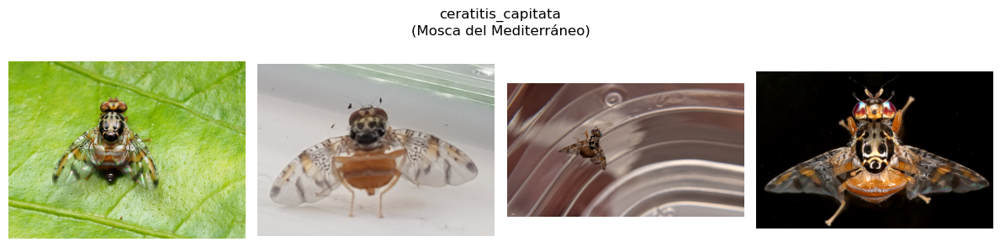

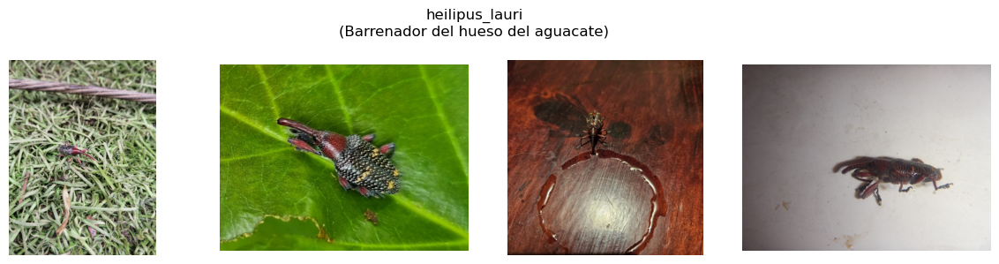

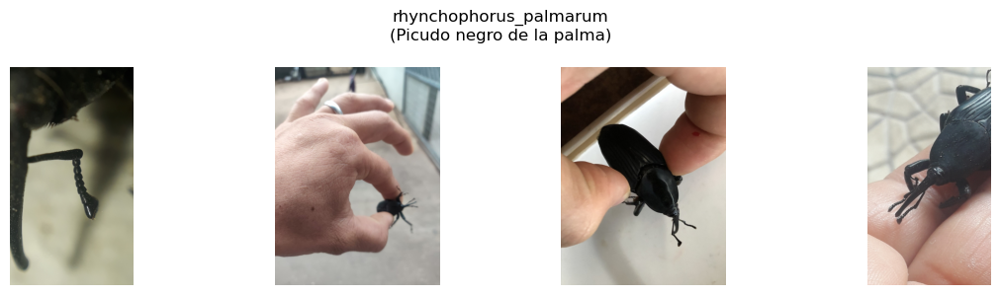

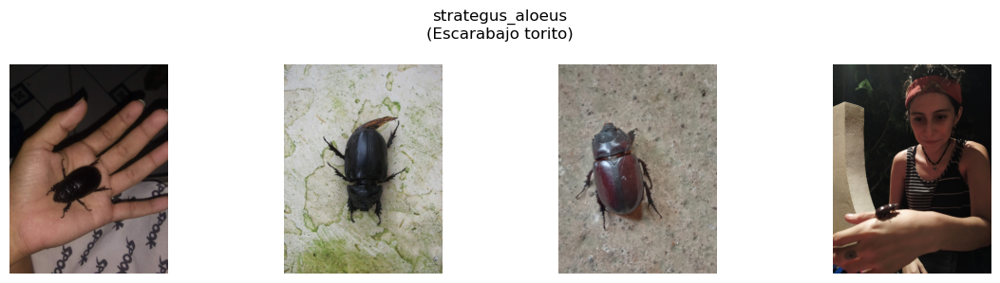

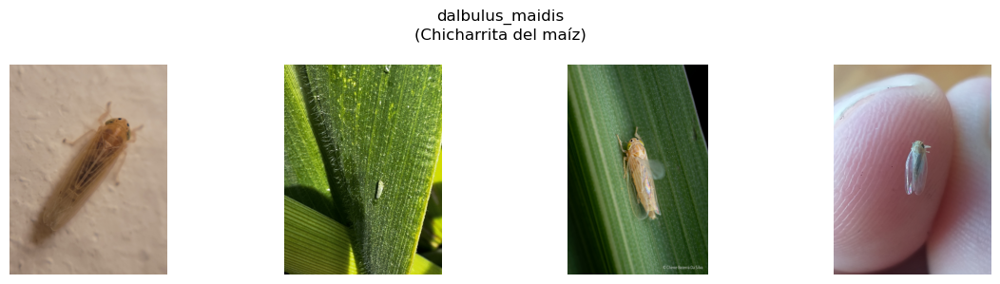

...

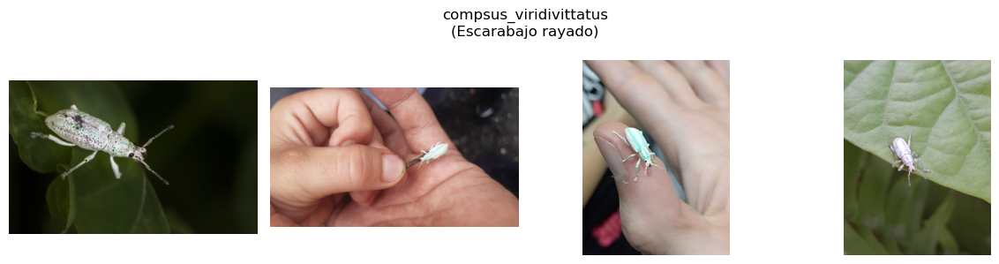

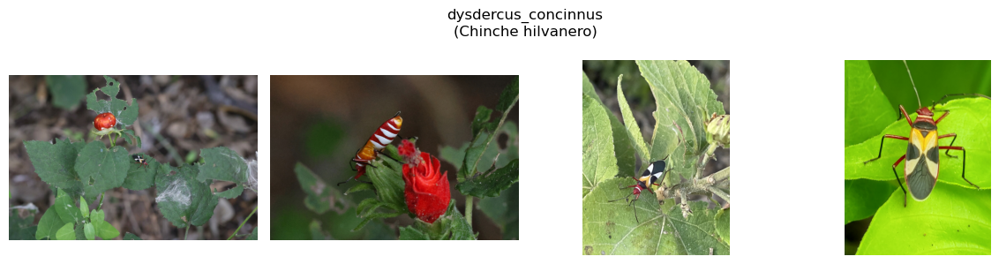

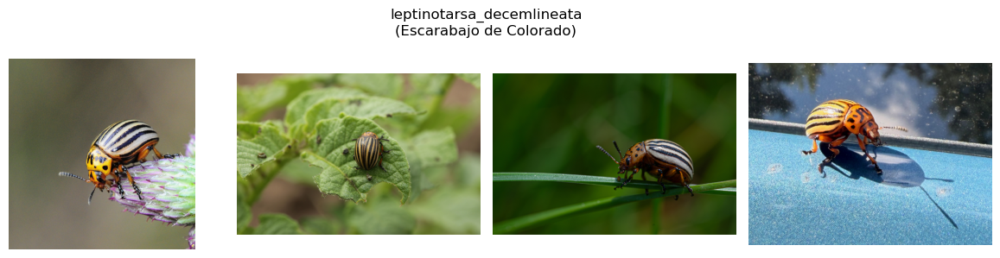

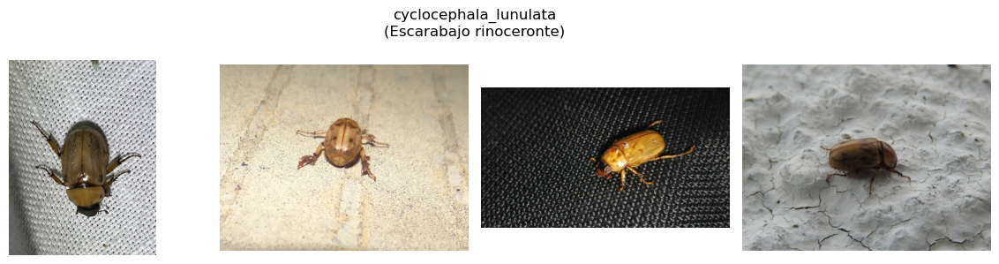

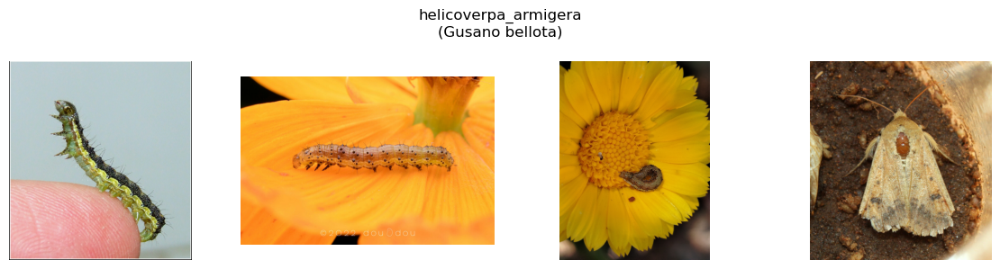

In [9]:
def show_sample_images(class_name, n_samples=5):
    """Muestra ejemplos de imágenes de una clase."""
    class_dir = DATA_DIR / class_name
    
    if not class_dir.exists():
        print(f"Directorio no existe: {class_dir}")
        return
    
    images = list(class_dir.glob("*.jpeg")) + list(class_dir.glob("*.jpg")) + list(class_dir.glob("*.png"))
    
    if not images:
        print(f"No hay imágenes en {class_name}")
        return
    
    # Seleccionar muestras aleatorias
    samples = random.sample(images, min(n_samples, len(images)))
    
    # Mostrar
    fig, axes = plt.subplots(1, len(samples), figsize=(3*len(samples), 3))
    if len(samples) == 1:
        axes = [axes]
    
    for ax, img_path in zip(axes, samples):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis('off')
    
    nombre_comun = PEST_CLASSES.get(class_name, {}).get('nombre_comun', class_name)
    plt.suptitle(f"{class_name}\n({nombre_comun})", fontsize=12)
    plt.tight_layout()
    plt.show()

# Mostrar ejemplos de cada clase descargada
print("Ejemplos de imágenes descargadas:\n")
for class_name in classes_to_download:
    show_sample_images(class_name, n_samples=4)

---
## 3. Preparación del Dataset

### 3.1 Ver estado actual del dataset

In [10]:
def count_images_in_directory(directory):
    """Cuenta imágenes por clase en un directorio."""
    counts = {}
    extensions = {'.jpg', '.jpeg', '.png', '.gif', '.bmp', '.webp'}
    
    if directory.exists():
        for class_dir in sorted(directory.iterdir()):
            if class_dir.is_dir():
                n_images = len([f for f in class_dir.iterdir() 
                               if f.is_file() and f.suffix.lower() in extensions])
                if n_images > 0:
                    counts[class_dir.name] = n_images
    return counts

# Contar imágenes en carpeta de datos originales
source_counts = count_images_in_directory(DATA_DIR)

print("=" * 60)
print("IMÁGENES DISPONIBLES EN CARPETA FUENTE")
print("=" * 60)
print(f"\nDirectorio: {DATA_DIR}")
print(f"\n{'Clase':<40} {'Imágenes':>10}")
print("-" * 52)

total_source = 0
for class_name, count in sorted(source_counts.items()):
    display_name = class_name[:38] + ".." if len(class_name) > 40 else class_name
    print(f"{display_name:<40} {count:>10}")
    total_source += count

print("-" * 52)
print(f"{'TOTAL':<40} {total_source:>10}")
print(f"\nClases con imágenes: {len(source_counts)}")

IMÁGENES DISPONIBLES EN CARPETA FUENTE

Directorio: C:\Users\santi\OneDrive\Desktop\UNIVERSIDAD\Semillero\Proyecto\Insectos

Clase                                      Imágenes
----------------------------------------------------
anastrepha_curvicauda                           300
atta_cephalotes                                 300
blissus_leucopterus                             300
ceratitis_capitata                              300
compsus_viridivittatus                          300
cyclocephala_lunulata                           300
dalbulus_maidis                                 135
diaphorina_citri                                300
diatraea_lisetta                                300
dysdercus_concinnus                             300
heilipus_lauri                                  189
helicoverpa_armigera                            300
leptinotarsa_decemlineata                       300
oebalus_insularis                                49
piezodorus_guildinii                      

### 3.2 Configurar división del dataset

In [11]:
# ============================================================
# CONFIGURACIÓN DE DIVISIÓN - MODIFICA AQUÍ
# ============================================================

# Proporciones para train/validation/test
TRAIN_RATIO = 0.70       # 70% para entrenamiento
VALIDATION_RATIO = 0.20  # 20% para validación
TEST_RATIO = 0.10        # 10% para test

# Semilla para reproducibilidad
RANDOM_SEED = 42

# Mínimo de imágenes requeridas por clase
MIN_IMAGES_PER_CLASS = 200

# ¿Limpiar dataset existente antes de dividir?
CLEAN_EXISTING = True

# ============================================================

# Verificar que las proporciones suman 1
total_ratio = TRAIN_RATIO + VALIDATION_RATIO + TEST_RATIO
if abs(total_ratio - 1.0) > 0.01:
    print(f"ERROR: Las proporciones deben sumar 1.0, pero suman {total_ratio}")
else:
    print("Configuración de división:")
    print(f"  Train:      {TRAIN_RATIO:.0%}")
    print(f"  Validation: {VALIDATION_RATIO:.0%}")
    print(f"  Test:       {TEST_RATIO:.0%}")
    print(f"\n  Semilla: {RANDOM_SEED}")
    print(f"  Mínimo imágenes por clase: {MIN_IMAGES_PER_CLASS}")
    print(f"  Limpiar existente: {CLEAN_EXISTING}")

Configuración de división:
  Train:      70%
  Validation: 20%
  Test:       10%

  Semilla: 42
  Mínimo imágenes por clase: 200
  Limpiar existente: True


### 3.3 Ejecutar división del dataset

In [12]:
def get_image_files(directory):
    """Obtiene todos los archivos de imagen en un directorio."""
    extensions = {'.jpg', '.jpeg', '.png', '.gif', '.bmp', '.webp'}
    files = []
    
    if directory.exists():
        for f in directory.iterdir():
            if f.is_file() and f.suffix.lower() in extensions:
                files.append(f)
    return files

def clean_dataset_directories():
    """Limpia los directorios del dataset procesado."""
    print("Limpiando dataset existente...")
    
    for split_dir in [TRAIN_DIR, VALIDATION_DIR, TEST_DIR]:
        if split_dir.exists():
            shutil.rmtree(split_dir)
            print(f"  Eliminado: {split_dir.name}")
    
    print("Dataset limpiado.\n")

def split_dataset():
    """Divide el dataset en train/validation/test."""
    
    # Establecer semilla
    random.seed(RANDOM_SEED)
    
    # Crear directorios
    TRAIN_DIR.mkdir(parents=True, exist_ok=True)
    VALIDATION_DIR.mkdir(parents=True, exist_ok=True)
    TEST_DIR.mkdir(parents=True, exist_ok=True)
    
    print("=" * 60)
    print("DIVIDIENDO DATASET")
    print("=" * 60)
    
    # Estadísticas
    stats = {
        "train": defaultdict(int),
        "validation": defaultdict(int),
        "test": defaultdict(int),
        "total": defaultdict(int),
        "skipped": [],
    }
    
    # Obtener clases disponibles
    available_classes = [d.name for d in DATA_DIR.iterdir() if d.is_dir()]
    
    for class_name in sorted(available_classes):
        source_dir = DATA_DIR / class_name
        images = get_image_files(source_dir)
        
        if not images:
            continue
        
        if len(images) < MIN_IMAGES_PER_CLASS:
            print(f"[SKIP] {class_name}: Solo {len(images)} imágenes (mínimo: {MIN_IMAGES_PER_CLASS})")
            stats["skipped"].append(class_name)
            continue
        
        # Mezclar
        random.shuffle(images)
        
        # Calcular índices
        n_total = len(images)
        n_train = int(n_total * TRAIN_RATIO)
        n_validation = int(n_total * VALIDATION_RATIO)
        
        # Dividir
        train_images = images[:n_train]
        validation_images = images[n_train:n_train + n_validation]
        test_images = images[n_train + n_validation:]
        
        # Copiar archivos
        splits = [
            ("train", TRAIN_DIR, train_images),
            ("validation", VALIDATION_DIR, validation_images),
            ("test", TEST_DIR, test_images),
        ]
        
        for split_name, split_dir, split_images in splits:
            dest_dir = split_dir / class_name
            dest_dir.mkdir(parents=True, exist_ok=True)
            
            for img_path in split_images:
                dest_path = dest_dir / img_path.name
                shutil.copy2(img_path, dest_path)
                stats[split_name][class_name] += 1
        
        stats["total"][class_name] = n_total
        
        print(f"[OK] {class_name}: {n_total} -> Train: {len(train_images)}, Val: {len(validation_images)}, Test: {len(test_images)}")
    
    return stats

# Ejecutar
if CLEAN_EXISTING:
    clean_dataset_directories()

stats = split_dataset()

Limpiando dataset existente...
  Eliminado: train
  Eliminado: validation
  Eliminado: test
Dataset limpiado.

DIVIDIENDO DATASET
[OK] anastrepha_curvicauda: 300 -> Train: 210, Val: 60, Test: 30
[OK] atta_cephalotes: 300 -> Train: 210, Val: 60, Test: 30
[OK] blissus_leucopterus: 300 -> Train: 210, Val: 60, Test: 30
[OK] ceratitis_capitata: 300 -> Train: 210, Val: 60, Test: 30
[OK] compsus_viridivittatus: 300 -> Train: 210, Val: 60, Test: 30
[OK] cyclocephala_lunulata: 300 -> Train: 210, Val: 60, Test: 30
[SKIP] dalbulus_maidis: Solo 135 imágenes (mínimo: 200)
[OK] diaphorina_citri: 300 -> Train: 210, Val: 60, Test: 30
[OK] diatraea_lisetta: 300 -> Train: 210, Val: 60, Test: 30
[OK] dysdercus_concinnus: 300 -> Train: 210, Val: 60, Test: 30
[SKIP] heilipus_lauri: Solo 189 imágenes (mínimo: 200)
[OK] helicoverpa_armigera: 300 -> Train: 210, Val: 60, Test: 30
[OK] leptinotarsa_decemlineata: 300 -> Train: 210, Val: 60, Test: 30
[SKIP] oebalus_insularis: Solo 49 imágenes (mínimo: 200)
[OK] p

### 3.4 Resumen del dataset dividido

In [13]:
# Mostrar resumen
print("\n" + "=" * 75)
print("RESUMEN DEL DATASET")
print("=" * 75)

print(f"\n{'Clase':<35} {'Total':>8} {'Train':>8} {'Val':>8} {'Test':>8}")
print("-" * 75)

total_train = 0
total_val = 0
total_test = 0
total_images = 0

for class_name in sorted(stats["total"].keys()):
    n_total = stats["total"][class_name]
    n_train = stats["train"][class_name]
    n_val = stats["validation"][class_name]
    n_test = stats["test"][class_name]
    
    display_name = class_name[:33] + ".." if len(class_name) > 35 else class_name
    print(f"{display_name:<35} {n_total:>8} {n_train:>8} {n_val:>8} {n_test:>8}")
    
    total_train += n_train
    total_val += n_val
    total_test += n_test
    total_images += n_total

print("-" * 75)
print(f"{'TOTAL':<35} {total_images:>8} {total_train:>8} {total_val:>8} {total_test:>8}")

# Porcentajes reales
if total_images > 0:
    print("\nPorcentajes reales:")
    print(f"  Train:      {total_train/total_images:.1%}")
    print(f"  Validation: {total_val/total_images:.1%}")
    print(f"  Test:       {total_test/total_images:.1%}")

# Clases activas
n_classes = len([c for c in stats["total"].keys() if stats["total"][c] > 0])
print(f"\nClases procesadas: {n_classes}")

if stats["skipped"]:
    print(f"Clases omitidas: {len(stats['skipped'])}")


RESUMEN DEL DATASET

Clase                                  Total    Train      Val     Test
---------------------------------------------------------------------------
anastrepha_curvicauda                    300      210       60       30
atta_cephalotes                          300      210       60       30
blissus_leucopterus                      300      210       60       30
ceratitis_capitata                       300      210       60       30
compsus_viridivittatus                   300      210       60       30
cyclocephala_lunulata                    300      210       60       30
diaphorina_citri                         300      210       60       30
diatraea_lisetta                         300      210       60       30
dysdercus_concinnus                      300      210       60       30
helicoverpa_armigera                     300      210       60       30
leptinotarsa_decemlineata                300      210       60       30
piezodorus_guildinii                  

---
## 4. Visualización del Dataset

### 4.1 Distribución de clases

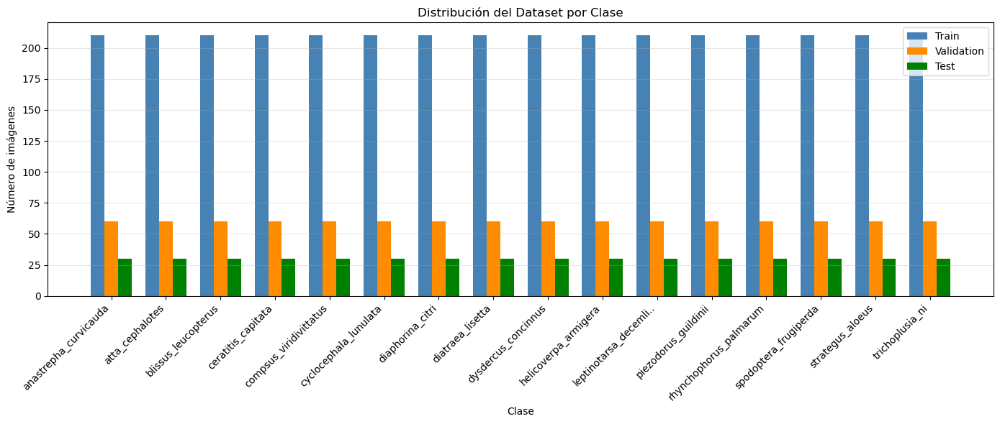

In [14]:
# Gráfico de barras de distribución
classes = list(stats["total"].keys())
train_counts = [stats["train"][c] for c in classes]
val_counts = [stats["validation"][c] for c in classes]
test_counts = [stats["test"][c] for c in classes]

# Acortar nombres para el gráfico
short_names = [c[:20] + ".." if len(c) > 22 else c for c in classes]

x = np.arange(len(classes))
width = 0.25

fig, ax = plt.subplots(figsize=(14, 6))
bars1 = ax.bar(x - width, train_counts, width, label='Train', color='steelblue')
bars2 = ax.bar(x, val_counts, width, label='Validation', color='darkorange')
bars3 = ax.bar(x + width, test_counts, width, label='Test', color='green')

ax.set_xlabel('Clase')
ax.set_ylabel('Número de imágenes')
ax.set_title('Distribución del Dataset por Clase')
ax.set_xticks(x)
ax.set_xticklabels(short_names, rotation=45, ha='right')
ax.legend()
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

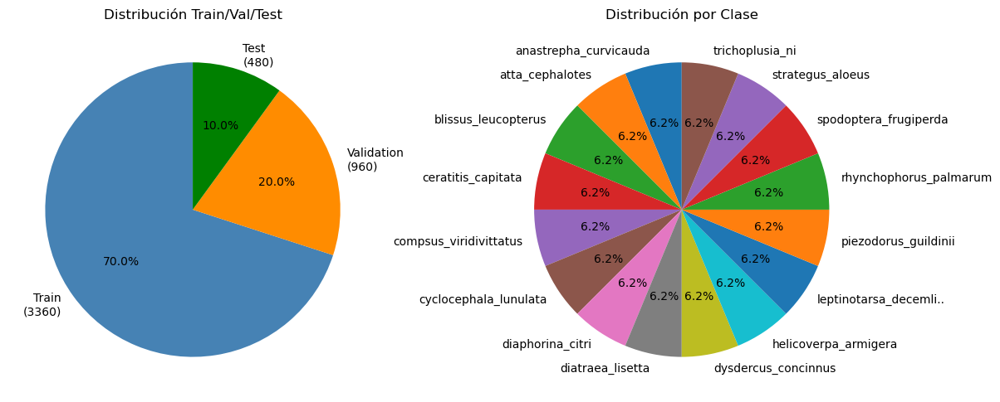

In [15]:
# Gráfico de pastel - proporción train/val/test
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Proporción general
sizes = [total_train, total_val, total_test]
labels = [f'Train\n({total_train})', f'Validation\n({total_val})', f'Test\n({total_test})']
colors = ['steelblue', 'darkorange', 'green']
axes[0].pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
axes[0].set_title('Distribución Train/Val/Test')

# Distribución por clase
total_per_class = [stats["total"][c] for c in classes]
axes[1].pie(total_per_class, labels=short_names, autopct='%1.1f%%', startangle=90)
axes[1].set_title('Distribución por Clase')

plt.tight_layout()
plt.show()

### 4.2 Ejemplos de imágenes del dataset

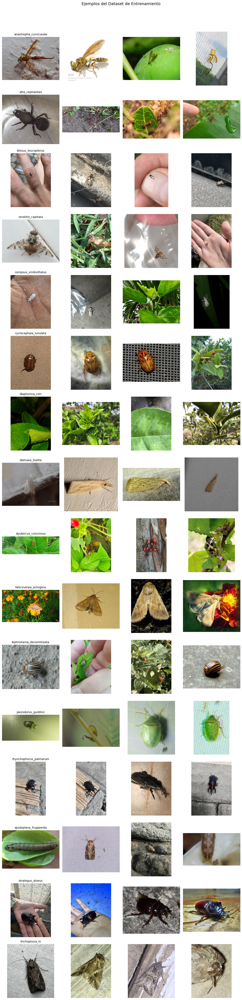

In [16]:
def show_dataset_samples(n_samples_per_class=3):
    """Muestra ejemplos de imágenes de cada clase en el dataset de entrenamiento."""
    classes_dirs = [d for d in TRAIN_DIR.iterdir() if d.is_dir()]
    n_classes = len(classes_dirs)
    
    if n_classes == 0:
        print("No hay clases en el dataset de entrenamiento.")
        return
    
    fig, axes = plt.subplots(n_classes, n_samples_per_class, 
                             figsize=(3*n_samples_per_class, 3*n_classes))
    
    if n_classes == 1:
        axes = [axes]
    
    for i, class_dir in enumerate(sorted(classes_dirs)):
        images = get_image_files(class_dir)
        samples = random.sample(images, min(n_samples_per_class, len(images)))
        
        for j in range(n_samples_per_class):
            ax = axes[i][j] if n_classes > 1 else axes[j]
            
            if j < len(samples):
                img = Image.open(samples[j])
                ax.imshow(img)
            
            ax.axis('off')
            
            if j == 0:
                # Mostrar nombre de clase
                class_name = class_dir.name
                short_name = class_name[:25] + ".." if len(class_name) > 27 else class_name
                ax.set_title(short_name, fontsize=10)
    
    plt.suptitle('Ejemplos del Dataset de Entrenamiento', fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

show_dataset_samples(n_samples_per_class=4)

---
## 5. Verificación Final

In [17]:
def verify_dataset():
    """Verifica la integridad del dataset."""
    print("Verificando integridad del dataset...\n")
    
    issues = []
    
    for split_name, split_dir in [("train", TRAIN_DIR), ("validation", VALIDATION_DIR), ("test", TEST_DIR)]:
        if not split_dir.exists():
            issues.append(f"Directorio no existe: {split_dir}")
            continue
        
        for class_dir in split_dir.iterdir():
            if class_dir.is_dir():
                images = get_image_files(class_dir)
                if len(images) == 0:
                    issues.append(f"Directorio vacío: {split_name}/{class_dir.name}")
    
    if issues:
        print("Problemas encontrados:")
        for issue in issues:
            print(f"  - {issue}")
        return False
    else:
        print("Dataset verificado correctamente.")
        return True

# Verificar
is_valid = verify_dataset()

# Resumen final
print("\n" + "=" * 60)
print("DATASET LISTO PARA ENTRENAMIENTO")
print("=" * 60)
print(f"\nUbicación: {DATASET_DIR}")
print(f"  - Train:      {TRAIN_DIR}")
print(f"  - Validation: {VALIDATION_DIR}")
print(f"  - Test:       {TEST_DIR}")
print(f"\nSiguiente paso: Ejecutar train_model.ipynb")

Verificando integridad del dataset...

Dataset verificado correctamente.

DATASET LISTO PARA ENTRENAMIENTO

Ubicación: C:\Users\santi\OneDrive\Desktop\UNIVERSIDAD\Semillero\Proyecto\dataset
  - Train:      C:\Users\santi\OneDrive\Desktop\UNIVERSIDAD\Semillero\Proyecto\dataset\train
  - Validation: C:\Users\santi\OneDrive\Desktop\UNIVERSIDAD\Semillero\Proyecto\dataset\validation
  - Test:       C:\Users\santi\OneDrive\Desktop\UNIVERSIDAD\Semillero\Proyecto\dataset\test

Siguiente paso: Ejecutar train_model.ipynb
